# Toronto Dwellings Analysis

In this assignment, you will perform fundamental analysis for the Toronto dwellings market to allow potential real estate investors to choose rental investment properties.

In [1]:
# imports
import panel as pn
pn.extension('plotly')
import plotly.express as px
import pandas as pd
import hvplot.pandas
import matplotlib.pyplot as plt
import os
from pathlib import Path
from dotenv import load_dotenv
from pathlib import Path  
import panel as pn
from panel.interact import interact

In [2]:
# Read the Mapbox API key
load_dotenv()
map_box_api = os.getenv("mapbox")
px.set_mapbox_access_token(map_box_api)

## Load Data

In [3]:
# Read the census data into a Pandas DataFrame
file_path = Path("Data/toronto_neighbourhoods_census_data.csv")
to_data = pd.read_csv(file_path, index_col="year")
to_data.head()

,neighbourhood,single_detached_house,apartment_five_storeys_plus,movable_dwelling,semi_detached_house,row_house,duplex,apartment_five_storeys_less,other_house,average_house_value,shelter_costs_owned,shelter_costs_rented
year,,,,,,,,,,,,
2001,Agincourt North,3715,1480,0,1055,1295,195,185,5,200388,810,870
2001,Agincourt South-Malvern West,3250,1835,0,545,455,105,425,0,203047,806,892
2001,Alderwood,3175,315,0,470,50,185,370,0,259998,817,924
2001,Annex,1060,6090,5,1980,605,275,3710,165,453850,1027,1378
2001,Banbury-Don Mills,3615,4465,0,240,380,15,1360,0,371864,1007,1163


- - - 

## Dwelling Types Per Year

In this section, you will calculate the number of dwelling types per year. Visualize the results using bar charts and the Pandas plot function. 

**Hint:** Use the Pandas `groupby` function.

**Optional challenge:** Plot each bar chart in a different color.

In [4]:
# Calculate the sum number of dwelling types units per year (hint: use groupby)
dwelling_types  = to_data[["single_detached_house", "apartment_five_storeys_plus",
                           "movable_dwelling","semi_detached_house","row_house"
                          ,"duplex","apartment_five_storeys_less","other_house"]]

dwelling_types_grp = dwelling_types.groupby(dwelling_types.index).sum()
dwelling_types_grp

,single_detached_house,apartment_five_storeys_plus,movable_dwelling,semi_detached_house,row_house,duplex,apartment_five_storeys_less,other_house
year,,,,,,,,
2001,300930,355015,75,90995,52355,23785,116900,3040
2006,266860,379400,165,69430,54690,44095,162850,1335
2011,274940,429220,100,72480,60355,44750,163895,2165
2016,269680,493270,95,71200,61565,48585,165575,2845


In [5]:
# Save the dataframe as a csv file
filepath = Path('dwelling_types_grp.csv') 
dwelling_types_grp.to_csv(filepath)

In [6]:
# Helper create_bar_chart function
def create_bar_chart(data, title, xlabel, ylabel, color):
    """
    Create a barplot based in the data argument.
    """
    bar_plot = data.plot(kind="bar",title=title,xlabel=xlabel,ylabel=ylabel,color=color)
    #Homework instructions mention - you will calculate the number of dwelling types per year and visualize the results
    # as a bar chart using the Pandas plot function.
    # it is not clear if we should use dataframe.plot or any other library that supports + operation
    #bar_plot=data.hvplot.bar()
    return bar_plot

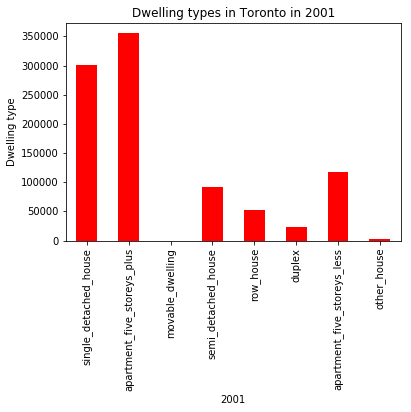

In [7]:
# Create a bar chart per year to show the number of dwelling types

# Bar chart for 2001
df_2001 = dwelling_types_grp.loc[2001]

bar_plot_2001 = create_bar_chart(df_2001,"Dwelling types in Toronto in 2001","2001","Dwelling type","red")
bar_plot_2001




- - - 

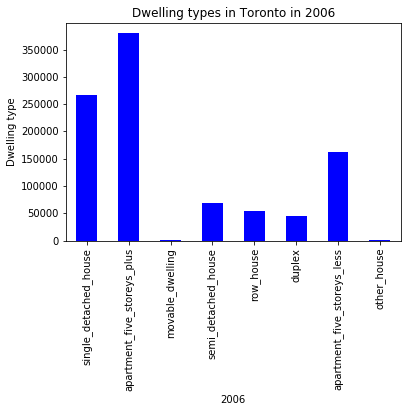

In [8]:
# Bar chart for 2006
df_2006 = dwelling_types_grp.loc[2006]
bar_plot_2006 = create_bar_chart(df_2006,"Dwelling types in Toronto in 2006","2006","Dwelling type","blue")


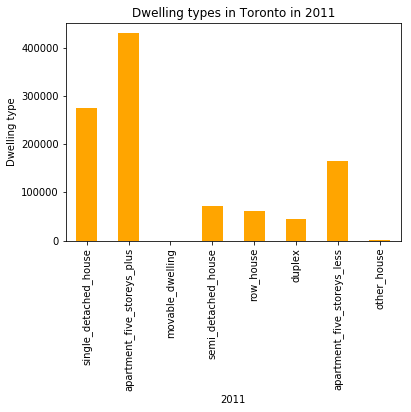

In [9]:

# Bar chart for 2011
df_2011 = dwelling_types_grp.loc[2011]
bar_plot_2011 = create_bar_chart(df_2011,"Dwelling types in Toronto in 2011","2011","Dwelling type","orange")



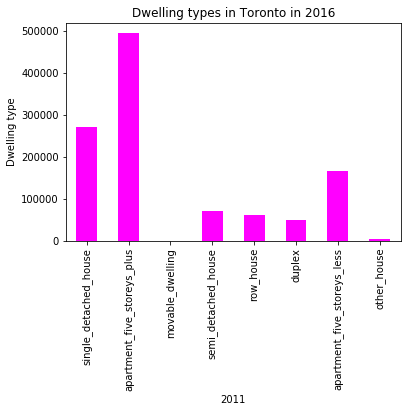

In [10]:

# Bar chart for 2016
df_2016 = dwelling_types_grp.loc[2016]
bar_plot_2016 = create_bar_chart(df_2016,"Dwelling types in Toronto in 2016","2011","Dwelling type","magenta")

#@todo - determine if all plots can be displayed in single cell using + operator


## Average Monthly Shelter Costs in Toronto Per Year

In this section, you will calculate the average monthly shelter costs for owned and rented dwellings and the average house value for each year. Plot the results as a line chart.

**Optional challenge:** Plot each line chart in a different color.

In [11]:
# Calculate the average monthly shelter costs for owned and rented dwellings
shelter_costs_by_types_df  = to_data[["shelter_costs_owned","shelter_costs_rented"]]
average_sale_prices_by_year = (shelter_costs_by_types_df.groupby("year").mean())
average_sale_prices_by_year


,shelter_costs_owned,shelter_costs_rented
year,,
2001,846.878571,1085.935714
2006,1316.800000,925.414286
2011,1448.214286,1019.792857
2016,1761.314286,1256.321429


In [12]:
# Helper create_line_chart function
def create_line_chart(data, title, xlabel, ylabel, color):
    """
    Create a line chart based in the data argument.
    """
    line_chart = data.plot(kind="line",title=title,xlabel=xlabel,ylabel=ylabel,color=color)
    return line_chart

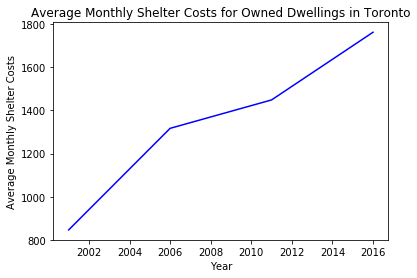

In [13]:
# Create two line charts, one to plot the monthly shelter costs for owned dwelleing and other for rented dwellings per year

# Line chart for owned dwellings
average_sale_price_owned_shelter = average_sale_prices_by_year["shelter_costs_owned"]
create_line_chart(average_sale_price_owned_shelter,"Average Monthly Shelter Costs for Owned Dwellings in Toronto","Year","Average Monthly Shelter Costs","blue")

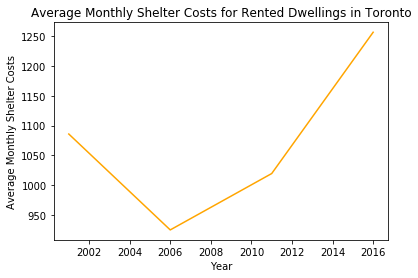

In [14]:
# Line chart for rented dwellings

average_sale_price_rented_shelter = average_sale_prices_by_year["shelter_costs_rented"]
create_line_chart(average_sale_price_rented_shelter,"Average Monthly Shelter Costs for Rented Dwellings in Toronto","Year","Average Monthly Shelter Costs","orange")

## Average House Value per Year

In this section, you want to determine the average house value per year. An investor may want to understand better the sales price of the rental property over time. For example, a customer will want to know if they should expect an increase or decrease in the property value over time so they can determine how long to hold the rental property. You will visualize the `average_house_value` per year as a bar chart.

In [15]:
# Calculate the average house value per year
average_house_value_df  = to_data["average_house_value"]
average_house_value_by_year = average_house_value_df.groupby("year").mean()
average_house_value_by_year

year
2001    289882.885714
2006    424059.664286
2011    530424.721429
2016    664068.328571
Name: average_house_value, dtype: float64

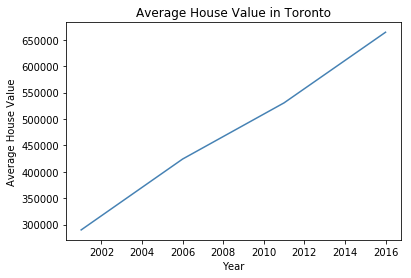

In [16]:
create_line_chart(average_house_value_by_year,"Average House Value in Toronto","Year","Average House Value","steelblue")

- - - 

## Average House Value by Neighbourhood

In this section, you will use `hvplot` to create an interactive visualization of the average house value with a dropdown selector for the neighbourhood.

**Hint:** It will be easier to create a new DataFrame from grouping the data and calculating the mean house values for each year and neighbourhood.

In [18]:
# Create a new DataFrame with the mean house values by neighbourhood per year
average_house_value_by_neighbourhood_df = to_data[["neighbourhood","average_house_value"]].groupby(["year","neighbourhood"]).mean()
average_house_value_by_neighbourhood_df = average_house_value_by_neighbourhood_df.reset_index()
average_house_value_by_neighbourhood_df

,year,neighbourhood,average_house_value
0,2001,Agincourt North,200388.0
1,2001,Agincourt South-Malvern West,203047.0
2,2001,Alderwood,259998.0
3,2001,Annex,453850.0
4,2001,Banbury-Don Mills,371864.0
...,...,...,...
555,2016,Wychwood,787760.0
556,2016,Yonge-Eglinton,1127052.0
557,2016,Yonge-St.Clair,1131888.0
558,2016,York University Heights,425769.0


In [19]:
# Use hvplot to create an interactive line chart of the average house value per neighbourhood
#grouped = average_house_value_by_neighbourhood_df.groupby(["year","neighbourhood"]).plot()
# The plot should have a dropdown selector for the neighbourhood

def plot_average_value_per_neighbourhood(neighbourhood):
    #print(neighbourhood)
    neighbourhood_specific_df = average_house_value_by_neighbourhood_df[average_house_value_by_neighbourhood_df["neighbourhood"]==neighbourhood]
    #print(neighbourhood_specific_df)
    average_price_by_year= neighbourhood_specific_df.groupby("year").mean()
   # print(average_price_by_year)
    line_chart = average_price_by_year.hvplot()
    return line_chart


#line_chart = plot_average_value_per_neighbourhood(average_house_value_by_neighbourhood_df,"Agincourt North")
#line_chart

unique_neighbourhoods = average_house_value_by_neighbourhood_df["neighbourhood"].unique().tolist()

# Execute interact function
interact(plot_average_value_per_neighbourhood, neighbourhood=unique_neighbourhoods)


Column
    [0] Column
        [0] Select(name='neighbourhood', options=['Agincourt North', ...], value='Agincourt North')
    [1] Row
        [0] HoloViews(Curve, name='interactive01554')

## Number of Dwelling Types per Year

In this section, you will use `hvplot` to create an interactive visualization of the average number of dwelling types per year with a dropdown selector for the neighbourhood.

In [20]:
# Fetch the data of all dwelling types per year
neighbourhood_dwelling_types  = to_data[["neighbourhood","single_detached_house", "apartment_five_storeys_plus",
                           "movable_dwelling","semi_detached_house","row_house"
                          ,"duplex","apartment_five_storeys_less","other_house"]].reset_index()
neighbourhood_dwelling_types

neighbourhood_dwelling_types_year = neighbourhood_dwelling_types.groupby(["neighbourhood","year"]).sum().reset_index()
#neighbourhood_dwelling_types_year



#dwelling_types_by_neighbourhood_df = neighbourhood_dwelling_types_year[neighbourhood_dwelling_types_year["neighbourhood"]=="Agincourt North"]
#dwelling_types_by_neighbourhood_df = dwelling_types_by_neighbourhood_df.drop(columns="neighbourhood")
#dwelling_types_by_neighbourhood_df
#dwelling_types_by_neighbourhood_df.hvplot.bar(rot=90, width=800, height=450,)




In [21]:
def plot_dwelling_types_per_neighbourhood(neighbourhood):
    #print(neighbourhood)
    dwelling_types_by_neighbourhood_df = neighbourhood_dwelling_types_year[neighbourhood_dwelling_types_year["neighbourhood"]==neighbourhood]
    dwelling_types_by_neighbourhood_df = dwelling_types_by_neighbourhood_df.drop(columns="neighbourhood")
    #print(dwelling_types_by_neighbourhood_df)
    bar_chart = dwelling_types_by_neighbourhood_df.hvplot.bar(rot=90, width=800, height=450)
    return bar_chart

# Execute interact function
interact(plot_dwelling_types_per_neighbourhood, neighbourhood=unique_neighbourhoods)

Column
    [0] Column
        [0] Select(name='neighbourhood', options=['Agincourt North', ...], value='Agincourt North')
    [1] Row
        [0] HoloViews(Bars, name='interactive01736')

- - - 

## The Top 10 Most Expensive Neighbourhoods

In this section, you will need to calculate the house value for each neighbourhood and then sort the values to obtain the top 10 most expensive neighbourhoods on average. Plot the results as a bar chart.

In [22]:
# Getting the data from the top 10 expensive neighbourhoods
neighbourhood_avg_house_value_years  = to_data[["neighbourhood","average_house_value"]]
neighbourhood_avg_house_value_mean = neighbourhood_avg_house_value_years.groupby("neighbourhood").mean()
neighbourhood_avg_house_value_mean_sorted=neighbourhood_avg_house_value_mean.sort_values(by=['average_house_value'], ascending=False)
neighbourhood_avg_house_value_top10 = neighbourhood_avg_house_value_mean_sorted.head(10)

In [23]:
# Plotting the data from the top 10 expensive neighbourhoods

neighbourhood_avg_house_value_top10
neighbourhood_avg_house_value_top10.hvplot.bar(rot=90,width=800, height=550)

:Bars   [neighbourhood]   (average_house_value)

- - - 

## Neighbourhood Map

In this section, you will read in neighbourhoods location data and build an interactive map with the average house value per neighbourhood. Use a `scatter_mapbox` from Plotly express to create the visualization. Remember, you will need your Mapbox API key for this.

### Load Location Data

In [24]:
# Load neighbourhoods coordinates data
file_path = Path("Data/toronto_neighbourhoods_coordinates.csv")
df_neighbourhood_locations = pd.read_csv(file_path)
df_neighbourhood_locations.head()

,neighbourhood,lat,lon
0,Agincourt North,43.805441,-79.266712
1,Agincourt South-Malvern West,43.788658,-79.265612
2,Alderwood,43.604937,-79.541611
3,Annex,43.671585,-79.404001
4,Banbury-Don Mills,43.737657,-79.349718


### Data Preparation

You will need to join the location data with the mean values per neighbourhood.

1. Calculate the mean values for each neighbourhood.

2. Join the average values with the neighbourhood locations.

In [25]:
# Calculate the mean values for each neighborhood
neighbourhood_avg_house_value_mean = neighbourhood_avg_house_value_mean.reset_index()
neighbourhood_avg_house_value_mean

,neighbourhood,average_house_value
0,Agincourt North,329811.50
1,Agincourt South-Malvern West,334189.00
2,Alderwood,427922.50
3,Annex,746977.00
4,Banbury-Don Mills,612039.00
...,...,...
135,Wychwood,565976.50
136,Yonge-Eglinton,809745.75
137,Yonge-St.Clair,813220.25
138,York University Heights,305899.50


In [26]:
# Join the average values with the neighbourhood locations
avg_values_with_location_df = pd.concat([df_neighbourhood_locations,neighbourhood_avg_house_value_mean], axis="columns", join="inner")
#drop duplicate column after concatination
avg_values_with_location_df = avg_values_with_location_df.loc[:,~avg_values_with_location_df.columns.duplicated()]
avg_values_with_location_df


,neighbourhood,lat,lon,average_house_value
0,Agincourt North,43.805441,-79.266712,329811.50
1,Agincourt South-Malvern West,43.788658,-79.265612,334189.00
2,Alderwood,43.604937,-79.541611,427922.50
3,Annex,43.671585,-79.404001,746977.00
4,Banbury-Don Mills,43.737657,-79.349718,612039.00
...,...,...,...,...
135,Wychwood,43.676919,-79.425515,565976.50
136,Yonge-Eglinton,43.704689,-79.403590,809745.75
137,Yonge-St.Clair,43.687859,-79.397871,813220.25
138,York University Heights,43.765736,-79.488883,305899.50


### Mapbox Visualization

Plot the average values per neighbourhood using a Plotly express `scatter_mapbox` visualization.

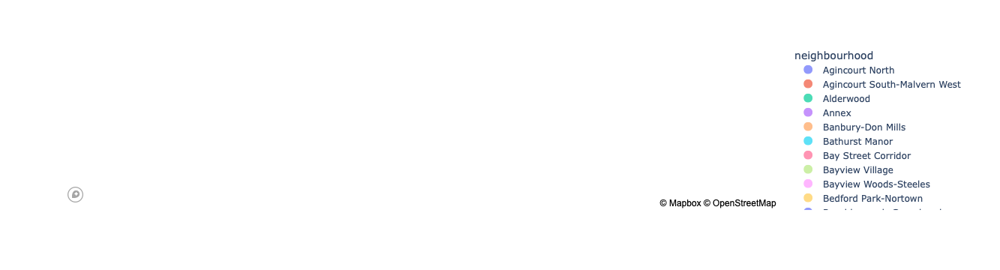

In [27]:
# Create a scatter mapbox to analyze neighbourhood info

map_plot = px.scatter_mapbox(
    avg_values_with_location_df,
    lat="lat",
    lon="lon",
    size="average_house_value",
    color="neighbourhood",
    zoom=8
)

# Display the map
map_plot.show()

- - -

## Cost Analysis - Optional Challenge

In this section, you will use Plotly express to a couple of plots that investors can interactively filter and explore various factors related to the house value of the Toronto's neighbourhoods. 

### Create a bar chart row facet to plot the average house values for all Toronto's neighbourhoods per year

In [43]:
avg_by_neighbourhood_year= = neighbourhood_avg_house_value_years.groupby(["neighbourhood","year"]).mean().reset_index()
avg_by_neighbourhood_year

,neighbourhood,year,average_house_value
0,Agincourt North,2001,200388.0
1,Agincourt North,2006,293140.0
2,Agincourt North,2011,366667.0
3,Agincourt North,2016,459051.0
4,Agincourt South-Malvern West,2001,203047.0
...,...,...,...
555,York University Heights,2016,425769.0
556,Yorkdale-Glen Park,2001,261784.0
557,Yorkdale-Glen Park,2006,382954.0
558,Yorkdale-Glen Park,2011,479009.0


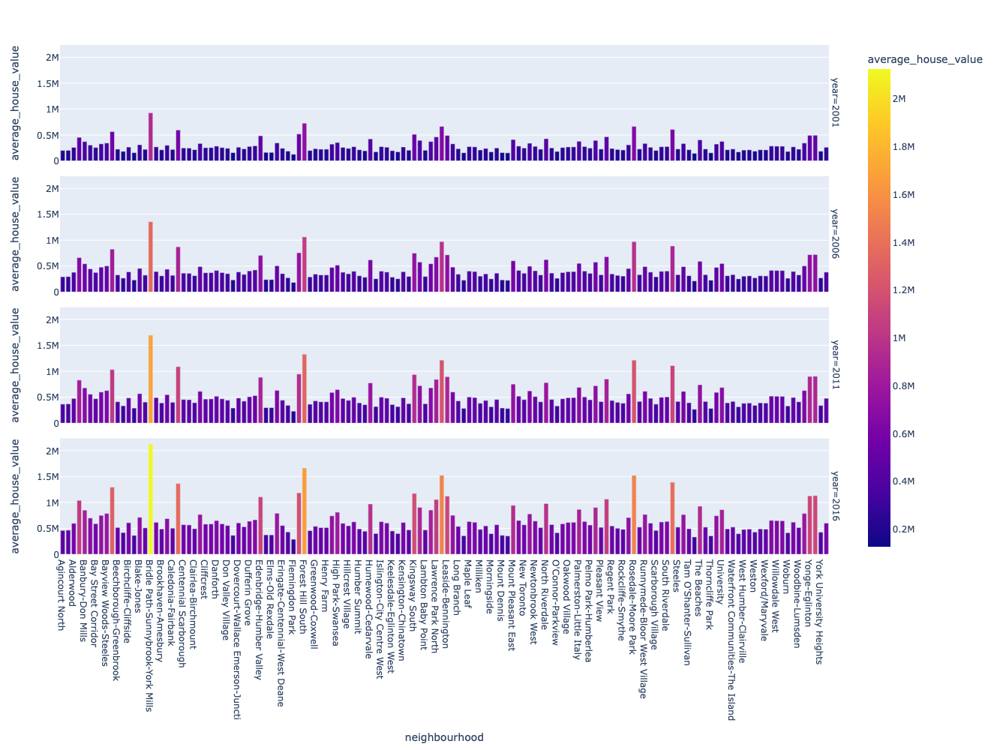

In [49]:

fig = px.bar(avg_by_neighbourhood_year, x="neighbourhood", y="average_house_value", color="average_house_value",facet_row="year")
fig.update_layout(
    autosize=False,
    width=1000,
    height=1000)
fig.show()

### Create a sunburst chart to conduct a costs analysis of most expensive neighbourhoods in Toronto per year

In [51]:
# Fetch the data from all expensive neighbourhoods per year.
avg_by_year_neighbourhood= neighbourhood_avg_house_value_years.groupby(["year","neighbourhood"]).mean().reset_index()
avg_by_year_neighbourhood

,year,neighbourhood,average_house_value
0,2001,Agincourt North,200388.0
1,2001,Agincourt South-Malvern West,203047.0
2,2001,Alderwood,259998.0
3,2001,Annex,453850.0
4,2001,Banbury-Don Mills,371864.0
...,...,...,...
555,2016,Wychwood,787760.0
556,2016,Yonge-Eglinton,1127052.0
557,2016,Yonge-St.Clair,1131888.0
558,2016,York University Heights,425769.0


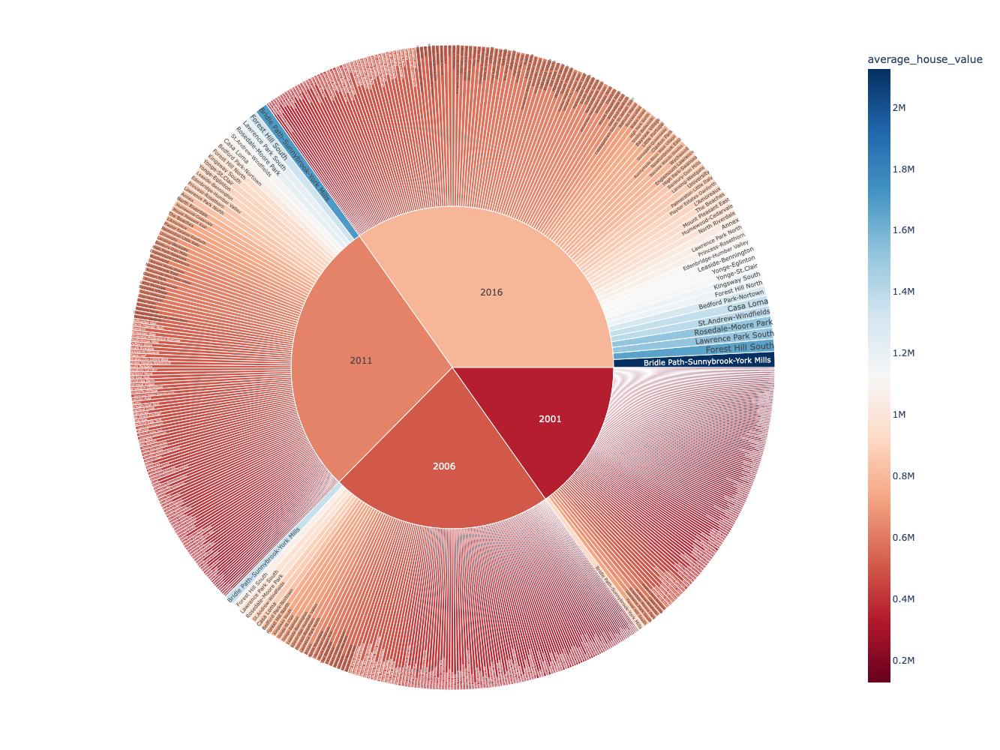

In [61]:
# Create the sunburst chart
fig_sunburst = px.sunburst(avg_by_year_neighbourhood, path=['year', 'neighbourhood'], values='average_house_value',
                  color='average_house_value', hover_data=['average_house_value'],
                  color_continuous_scale='RdBu',width=1000,height=1000
                  )

fig.update_layout(
    autosize=False,
    width=1000,
    height=1000)
fig_sunburst.show()